# Calculo de cascaras del gas ionizado con observaciones de JWST

En  este caso vamos a hacer el mismo ajuste que hicimos con las observaciones del HST pero ahora al combo E que es el gas ionizado.

En un principio esto debería ser muy similar, pero debido a que tenemos una resolución diferente podremos decir si en realidad son cáscaras o no. Además vamos a encontrar cáscaras que no se habían detectado en el HST y podemos aumentar la muestra de glóbulos con los que haremos estadísticas y otras cosas. 

In [1]:
from astropy.io import fits
import pyregion
import numpy as np
import matplotlib.pyplot as plt
from astropy import units as u
from astropy import constants as cte 
import regions
from astropy.wcs import WCS
import cmasher as cm
import seaborn as sn
from discrete_gaussian_model import DiscreteGaussianModel
from astropy.nddata import Cutout2D
from astropy.coordinates import Angle
from astropy.modeling import models, fitting
from astropy.modeling.models import Const1D
from astropy.table import QTable, Table
from astropy.coordinates import SkyCoord
FITTER = fitting.LevMarLSQFitter()

In [2]:
'''Primero cargamos las ubicacionees de los globules que se encuentran en la carpeta M1-67'''
regs = regions.Regions.read('m1-67-globules.reg', format="ds9")
regs = [_ for _ in regs if hasattr(_, 'center') and _.visual.get('marker') == "o"]

In [3]:
c0 = SkyCoord.from_name('wr124', cache=True)

source_table = QTable(
    [
        {"ICRS": r.center, "Isolated": r.visual.get('markeredgewidth') == 3} 
        for r in regs
    ]
)

source_table["PA"] = c0.position_angle(source_table["ICRS"]).to(u.deg)
source_table["Sep"] = source_table["ICRS"].separation(c0).to(u.arcsec)
source_table["PA"].info.format = ".2f"
source_table["Sep"].info.format = ".2f"

In [6]:
class SourceCutout:
    """Small image cut out around a given source
    """
    
    def __init__(self, pdata, hdu, size=3 * u.arcsec):
        self.center = pdata["ICRS"]
        # PA of source wrt star
        self.pa_source = pdata["PA"]
        # and PA of star wrt source
        self.pa_star = Angle(self.pa_source + 180 * u.deg).wrap_at(360 * u.deg)
        self.sep = pdata["Sep"]
        self.is_isolated = pdata["Isolated"]
        self.size = size
        self.cutout = Cutout2D(
            hdu.data, position=self.center, size=size, wcs=WCS(hdu), copy=True,
        )
        self.image = self.cutout.data
        self.wcs = self.cutout.wcs
        ny, nx = self.image.shape
        self.x, self.y = np.meshgrid(np.arange(nx), np.arange(ny))
        self.image_coords = self.wcs.pixel_to_world(self.x, self.y)
        #self.cero = self.image[self.cutout.mask][0]
        # Radius and PA of each pixel with respect to the NOMINAL center
        self.r = self.center.separation(self.image_coords)
        self.pa = self.center.position_angle(self.image_coords)
        # Default mask has max radius of half the cutout size
        self.set_mask(r_out=self.size / 2)

        self.find_bary_center()
        # Recalculate r, pa, and masks wrt the barycenter
        self.r = self.barycenter.separation(self.image_coords)
        self.pa = self.barycenter.position_angle(self.image_coords)
        self.set_mask(r_out=self.size / 2)

        # And do photometry
        self.bright_peak = np.max(self.image[self.coremask])
        '''
        intento de añadir el primer indice solamente
        '''
        self.cero = self.image[self.mask]
        # Take the 10% centile as estimate of BG value
        self.bright_bg = np.percentile(
            self.image[self.mask],
            10,
        )
        # BG-subtracted of the core region
        self.flux_core = np.sum((self.image - self.bright_bg)[self.coremask])
        # BG-subtracted part of the outer part within the mask but excluding core
        self.flux_halo = np.sum(
            (self.image - self.bright_bg)[(~self.coremask) & self.mask]
            )
        
    def __repr__(self):
        return f"SourceCutout({self.pa_source:.1f}, {self.sep:.1f})"
       
         
    def set_mask(
        self,
        r_out = 1.0 * u.arcsec,
        r_in = 0.2 * u.arcsec,
        r_core = 0.2 * u.arcsec,
        mu_min = 0.5,
    ):
        cth = np.cos((self.pa - self.pa_star))
        self.mask = (self.r <= r_out) & ((cth >= mu_min) | (self.r <= r_in))
        self.coremask = (self.r <= r_in)

    def find_bary_center(self):
        """Refine estimate of center by using flux-weighted mean
        position within the core mask
        """
        m = self.coremask

        # Original version was flux-weighted mean
        # xbary = np.average(self.x[m], weights=self.image[m])
        # ybary = np.average(self.x[m], weights=self.image[m])

        # New version is just the peak pixel
        index = np.argmax(self.image[m], axis=None)
        xbary = self.x[m][index]
        ybary = self.y[m][index]

        self.barycenter = self.wcs.pixel_to_world(xbary, ybary)

In [29]:
def fit_to_cutout(cutout):
    g0 = DiscreteGaussianModel(
        amplitude=3.0, mean=0.0, stddev=0.1, 
        bin_width=0.1, fixed={"bin_width": True},
        )
    g0.mean.fixed = True
    g0.stddev.bounds = 0.01, 0.5
    g0.amplitude.bounds = 0.01, 20.0

    g1 = DiscreteGaussianModel(
        amplitude=3.0, mean=0.5, stddev=0.2,
        bin_width=0.1, fixed={"bin_width": True},
        )
    g1.mean.bounds = 0.1, 1.5
    g1.stddev.bounds = 0.01, 1.0
    g1.amplitude.bounds = 0.01, 20.0

    c0 = Const1D(amplitude=cutout.bright_bg)
    c0.amplitude.bounds = 0.0, 1.5 * cutout.bright_bg

    model = g0 + g1 + c0
    
    
        
    '''Pruebas para quitar los puntos que son mas brillantes y nos pueden estorbar'''
    blimit = cutout.bright_peak      #encontrar el pico
    bm = cutout.image < blimit     # Es un operador que nos da solo los menores
    m = cutout.mask & bm           #Es el  operador logico 'and'
    b = cutout.image[m]
    r = cutout.r[m].arcsec
    
    #m = cutout.mask
    #r = cutout.r[m].arcsec
    #b = cutout.image[m]
    th = Angle(cutout.pa - cutout.pa_star).wrap_at(180*u.deg)[m]
    w = np.cos(th)**2 / (0.3 + r)**2
    
    #cutout.blimit_ = blimit
    #cutout.bm_ = bm
    #cutout.m_ = m
    #cutout.b_ = b

    cutout.fitted = FITTER(model, r, b, weights=w)
    cutout.core_sigma = cutout.fitted.stddev_0.value
    cutout.shell_radius = cutout.fitted.mean_1.value
    cutout.shell_sigma = cutout.fitted.stddev_1.value
    cutout.core_peak = cutout.fitted[0](0.0)
    cutout.shell_peak = cutout.fitted[1](cutout.shell_radius)
    cutout.bg_fit_level = cutout.fitted.amplitude_2.value

Set OBSGEO-B to   -31.536287 from OBSGEO-[XYZ].
Set OBSGEO-H to 1653867491.040 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


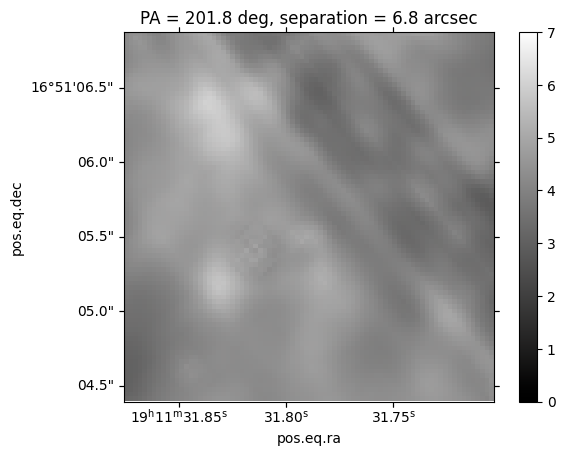

In [30]:
'''Aqui mostramos como se deberiain de ver'''
filter_ = fits.open('//home/rreyes/Downloads/combo-E-ionized.fits')
hdu = filter_['SCI']
wcs = WCS(hdu)

j1, i1 = wcs.world_to_array_index(source_table[43]['ICRS'])
size = 40
yslice, xslice = slice(j1 - size, j1 + size), slice(i1 - size, i1 + size)
cutout = hdu.data[yslice, xslice]
wcutout = wcs.slice((yslice, xslice))

fig = plt.figure()
ax = fig.add_subplot(projection=wcutout)
im = ax.imshow(cutout, vmin=0.0, cmap=cm.neutral,vmax=7)
cb = fig.colorbar(im, ax=ax)
ax.set_title(f"PA = {source_table[0]['PA']:.1f}, separation = {source_table[0]['Sep']:.1f}")
...;

Set OBSGEO-B to   -31.536287 from OBSGEO-[XYZ].
Set OBSGEO-H to 1653867491.040 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


Text(0.5, 1.0, 'PA = 207.0 deg, separation = 17.8 arcsec')

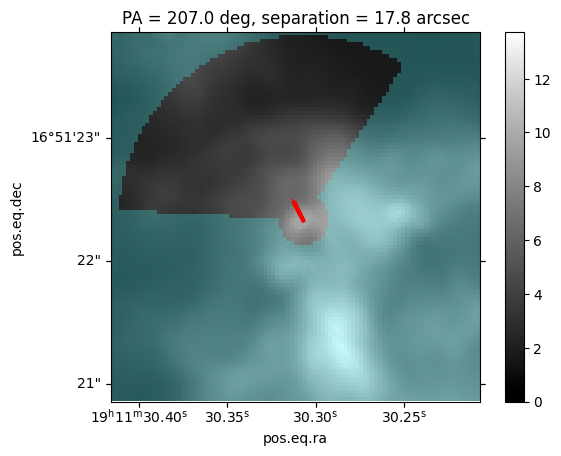

In [31]:
source = source_table[45]
cutout = SourceCutout(source, hdu)

fig = plt.figure()
ax = fig.add_subplot(projection=cutout.wcs)
im = ax.imshow(
    cutout.image,
    vmin=0.0, 
    cmap=cm.neutral,
    )
cb = fig.colorbar(im, ax=ax)
ax.imshow(np.where(cutout.mask, np.nan, 1.0), vmin=0, vmax=1, cmap=cm.gem, alpha=0.3)
y1, x1 = cutout.wcs.world_to_array_index(cutout.barycenter)
arrow_length = 5.0
dx, dy = -arrow_length * np.sin(cutout.pa_star), arrow_length * np.cos(cutout.pa_star)
ax.arrow(x1, y1, dx, dy, color='r', lw=3)
ax.set_title(f"PA = {cutout.pa_source:.1f}, separation = {cutout.sep:.1f}")

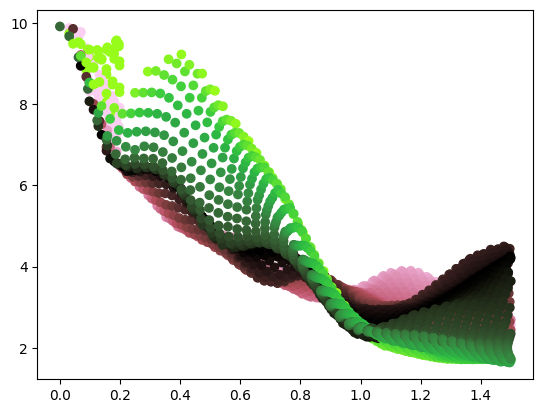

In [32]:
fig, ax = plt.subplots()
m = cutout.mask
ax.scatter(
    cutout.r[m].arcsec, 
    cutout.image[m], 
    c=Angle(cutout.pa - cutout.pa_star).wrap_at(180*u.deg).deg[m], 
    vmin=-60, vmax=60,
    cmap=cm.watermelon)

In [33]:
cutouts = [SourceCutout(source, hdu) for source in source_table]
cutouts = sorted(cutouts, key=lambda x: x.sep.value)

best_cutouts = [cutout for cutout in cutouts if cutout.is_isolated]

Set OBSGEO-B to   -31.536287 from OBSGEO-[XYZ].
Set OBSGEO-H to 1653867491.040 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -31.536287 from OBSGEO-[XYZ].
Set OBSGEO-H to 1653867491.040 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -31.536287 from OBSGEO-[XYZ].
Set OBSGEO-H to 1653867491.040 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -31.536287 from OBSGEO-[XYZ].
Set OBSGEO-H to 1653867491.040 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -31.536287 from OBSGEO-[XYZ].
Set OBSGEO-H to 1653867491.040 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -31.536287 from OBSGEO-[XYZ].
Set OBSGEO-H to 1653867491.040 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -31.536287 from OBSGEO-[XYZ].
Set OBSGEO-H to 1653867491.040 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -31.536287 from OBSGEO-[XYZ].
Set OBSGEO-H to 1653867491.040 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -31.536287 from OBSGEO-[XYZ].
Set OBSGEO-H to 

In [34]:
cutout = best_cutouts[2]
fit_to_cutout(cutout)

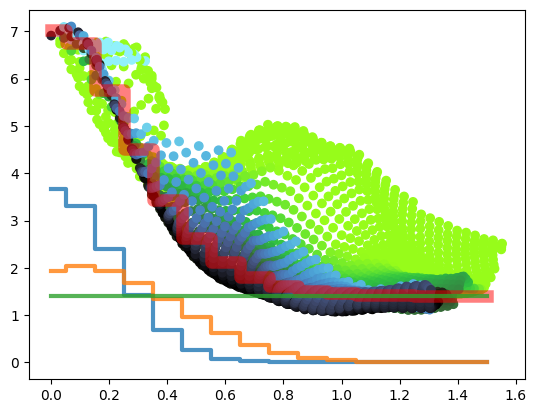

In [35]:
fig, ax = plt.subplots()
ax.scatter(
    cutout.r[m].arcsec, 
    cutout.image[m], 
    c=Angle(cutout.pa - cutout.pa_star).wrap_at(180*u.deg).deg[m], 
    vmin=-60, vmax=60,
    cmap=cm.seaweed)
rgrid = np.linspace(0.0, 1.5, 16)
ax.plot(rgrid, cutout.fitted(rgrid), drawstyle="steps-mid", linewidth=9, c='r', alpha=0.5)
for component in cutout.fitted:
    ax.plot(rgrid, component(rgrid), drawstyle="steps-mid", linewidth=3, alpha=0.8)

In [36]:
for cutout in cutouts:
    fit_to_cutout(cutout)

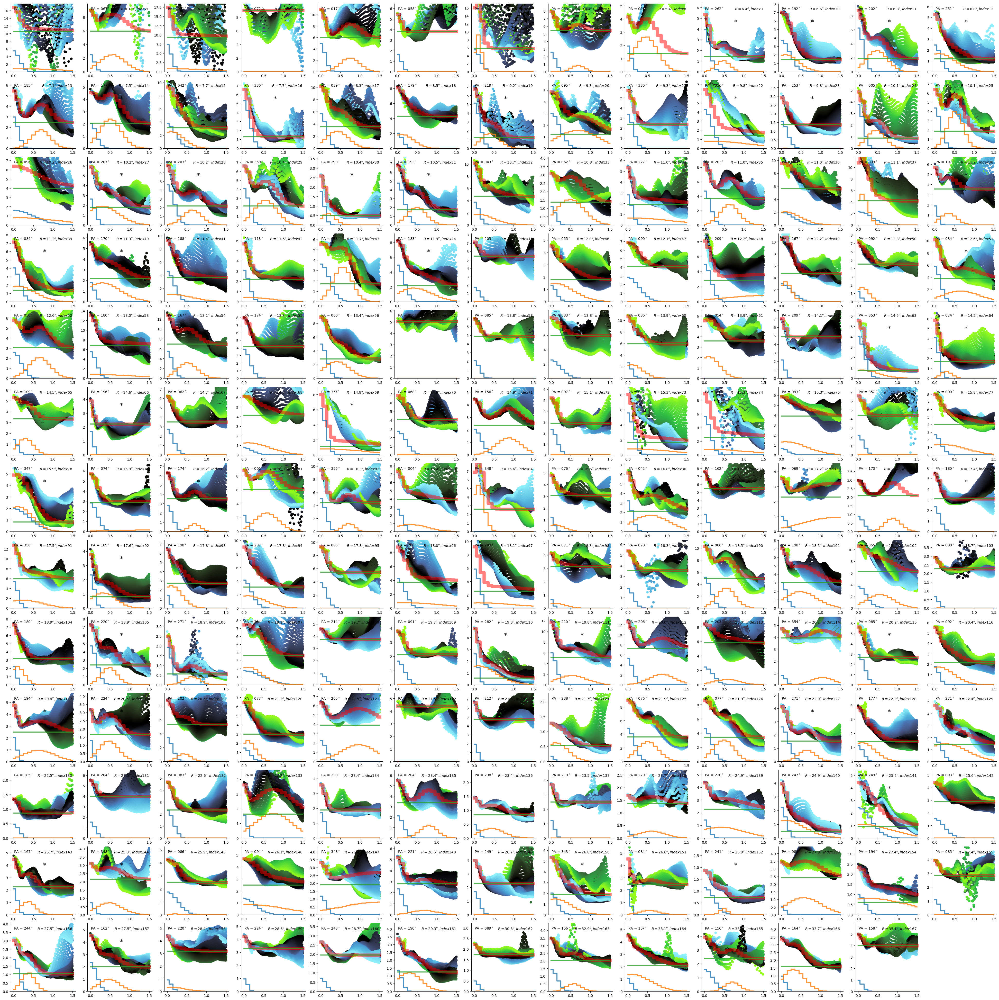

In [37]:
fig = plt.figure(figsize=(39, 39))
for idx, cutout in enumerate(cutouts):
    ax = fig.add_subplot(13, 13, idx + 1)
    m = cutout.mask
    ax.scatter(
        cutout.r[m].arcsec, 
        cutout.image[m], 
        c=Angle(cutout.pa - cutout.pa_star).wrap_at(180*u.deg).deg[m], 
        vmin=-60, vmax=60,
        cmap=cm.seaweed)
    if cutout in best_cutouts:
        ax.text(0.5, 0.7, '*', transform=ax.transAxes, fontsize='xx-large')
    
    rgrid = np.linspace(0.0, 1.5, 16)
    ax.plot(rgrid, cutout.fitted(rgrid), drawstyle="steps-mid", linewidth=9, c='r', alpha=0.5)
    for component in cutout.fitted:
        ax.plot(rgrid, component(rgrid), drawstyle="steps-mid", linewidth=3, alpha=0.8)
    
    lim_y = cutout.fitted(rgrid)[0]
        
    plt.ylim(0,lim_y+1)

    ax.text(0.05, 0.95, rf'PA = {round(cutout.pa_source.value):03d}$^\circ$', transform=ax.transAxes, va="top", ha="left")
    ax.text(0.95, 0.95, rf"$R = {cutout.sep.value:.1f}'', index {idx}$", transform=ax.transAxes, va="top", ha="right")
    ax.set(xlabel="", ylabel="", ylim=[0.0, None])
sn.despine()
fig.tight_layout(h_pad=0.3, w_pad=0.3)
...;

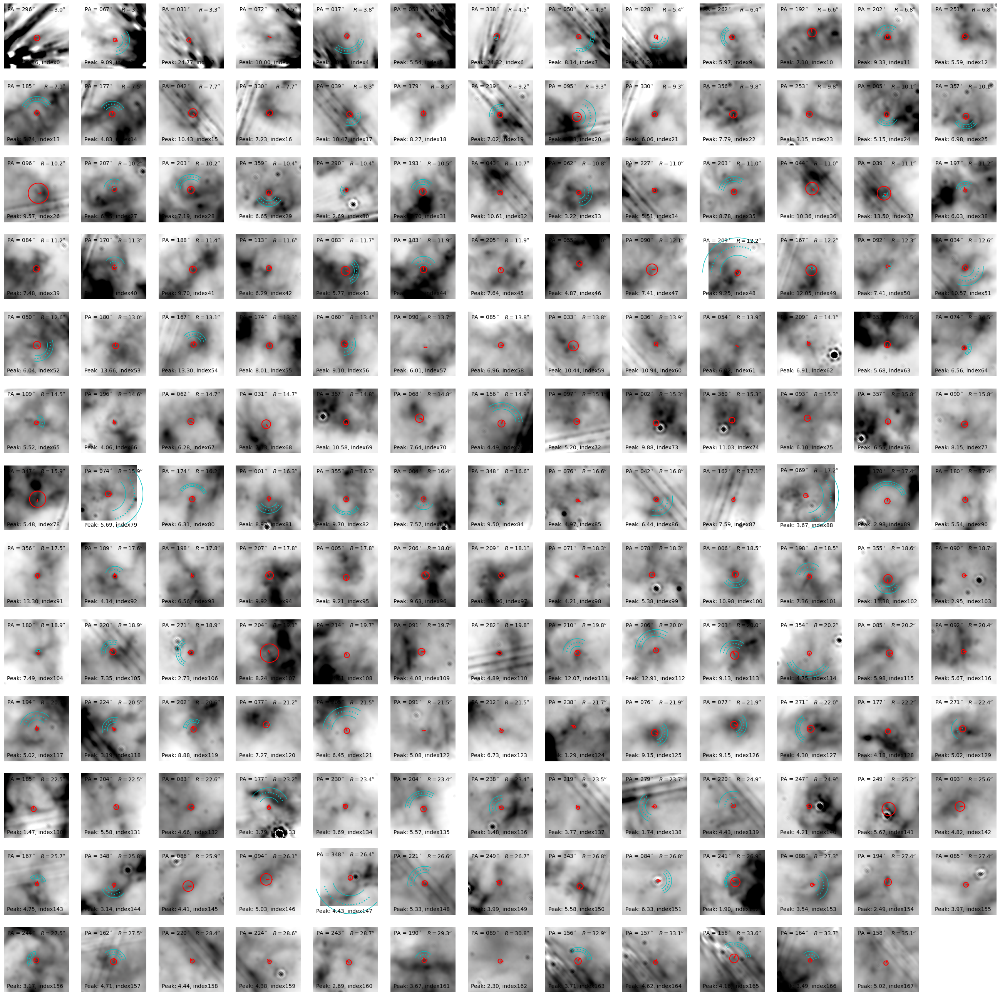

In [45]:
fig = plt.figure(figsize=(26, 26))
for idx, cutout in enumerate(cutouts):
    ax = fig.add_subplot(13, 13, idx + 1)
    im = ax.imshow(
        cutout.image, 
        vmin=0.5 * cutout.bright_bg,  
        vmax=max(cutout.bright_peak, 2 * cutout.shell_peak) + cutout.bright_bg, 
        cmap=cm.neutral_r, 
        origin='lower',
        )
    x1, y1 = cutout.wcs.world_to_pixel(cutout.barycenter)
    arrow_length = 5.0
    dx, dy = -arrow_length * np.sin(cutout.pa_star), arrow_length * np.cos(cutout.pa_star)
    ax.arrow(x1, y1, dx, dy, color='r', width=0.5, head_width=1.5, length_includes_head=True, )

    # Plot the sigma of core peak as circle
    angles = np.linspace(0, 360, 100) * u.deg
    rcore = cutout.core_sigma / 0.033 # in pixels
    x = x1 + rcore * np.cos(angles)
    y = y1 + rcore * np.sin(angles)
    ax.plot(x, y, color='r')

    # Plot the shell
    angles = np.linspace(
        cutout.pa_star - 60 * u.deg, 
        cutout.pa_star + 60 * u.deg, 
        100,
        )
    if cutout.shell_peak > 0.1 and cutout.shell_sigma/2 < cutout.shell_radius:
        for shift, ls, lw in zip([-1, 0, 1], ["-", ":", "-"], [1, 2, 1]):
            rshell = (cutout.shell_radius 
                      + shift * cutout.shell_sigma/2) / 0.033
            x = x1 - rshell * np.sin(angles)
            y = y1 + rshell * np.cos(angles)
            ax.plot(x, y, color='c', lw=lw, ls=ls)

    ax.text(0.05, 0.95, rf'PA = {round(cutout.pa_source.value):03d}$^\circ$', transform=ax.transAxes, va="top", ha="left")
    ax.text(0.95, 0.95, rf"$R = {cutout.sep.value:.1f}''$", transform=ax.transAxes, va="top", ha="right")
    ax.text(0.05, 0.05, rf"Peak: {cutout.bright_peak:.2f}, index{idx}", transform=ax.transAxes, va="bottom", ha="left")

    ax.set(xlabel="", ylabel="", xticks=[], yticks=[])
sn.despine(left=True, bottom=True)
fig.tight_layout(pad=0, h_pad=0.1, w_pad=0.1)
...;

In [46]:
fig.savefig("combo-E.pdf")

In [40]:
table_select = []
table = []
for cutout in cutouts:
    table_select.append(
            {
            "PA": cutout.pa_source,
            "Sep": cutout.sep,
            "Bcore": cutout.core_peak,
            "Bshell": cutout.shell_peak,
            "Bbg": cutout.bg_fit_level,
            "Rcore": cutout.core_sigma * u.arcsec,
            "Rshell": cutout.shell_radius * u.arcsec,
            "Hshell": cutout.shell_sigma * u.arcsec
         }
    )

results_table_sel = QTable(table_select)
for col in results_table_sel.itercols():
    try:
        col.info.format = ".2f"
    except ValueError:
        pass
    
for cutout in cutouts:
    table.append(
            {
            "PA": cutout.pa_source,
            "Sep": cutout.sep,
            "Bcore": cutout.core_peak,
            "Bshell": cutout.shell_peak,
            "Bbg": cutout.bg_fit_level,
            "Rcore": cutout.core_sigma * u.arcsec,
            "Rshell": cutout.shell_radius * u.arcsec,
            "Hshell": cutout.shell_sigma * u.arcsec
         }
    )

results_table = QTable(table)
for col in results_table.itercols():
    try:
        col.info.format = ".2f"
    except ValueError:
        pass
    
results_table

PA,Sep,Bcore,Bshell,Bbg,Rcore,Rshell,Hshell
deg,arcsec,,,,arcsec,arcsec,arcsec
float64,float64,float64,float64,float64,float64,float64,float64
296.28,2.98,5.47,0.80,10.57,0.14,0.10,1.00
66.87,3.15,2.48,2.50,5.95,0.09,0.56,0.32
30.92,3.31,7.29,0.80,9.36,0.11,0.10,1.00
71.97,3.52,0.01,0.01,8.98,0.01,0.10,0.01
16.83,3.80,4.93,2.43,5.96,0.11,0.75,0.25
57.69,4.38,1.64,0.01,3.81,0.09,0.79,0.01
...,...,...,...,...,...,...,...
88.55,30.80,0.49,0.01,1.73,0.10,0.10,0.01


In [41]:
df = results_table.to_pandas()

df.describe()

,PA,Sep,Bcore,Bshell,Bbg,Rcore,Rshell,Hshell
count,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000
mean,168.106302,16.980575,2.610087,1.224425,3.060817,0.139028,0.463452,0.399321
std,98.237666,7.119153,1.611187,1.214343,1.772693,0.070201,0.428909,0.324161
min,0.869823,2.984176,0.010000,0.000399,0.481741,0.010000,0.100000,0.010000
25%,84.269909,11.526672,1.432847,0.276065,1.844773,0.101112,0.100000,0.194069
50%,179.449531,16.476920,2.227768,1.018797,2.645717,0.129565,0.364647,0.306526
75%,220.171022,21.928773,3.754178,1.770013,3.977039,0.154981,0.641804,0.487199
max,359.624454,35.096384,7.293658,9.232892,10.566352,0.500000,1.500000,1.000000


(array([25.,  3., 16., 20., 25., 15., 12., 11.,  5.,  3.,  0.,  1.,  0.,
         1.,  1., 30.]),
 array([0.01    , 0.071875, 0.13375 , 0.195625, 0.2575  , 0.319375,
        0.38125 , 0.443125, 0.505   , 0.566875, 0.62875 , 0.690625,
        0.7525  , 0.814375, 0.87625 , 0.938125, 1.      ]),
 <BarContainer object of 16 artists>)

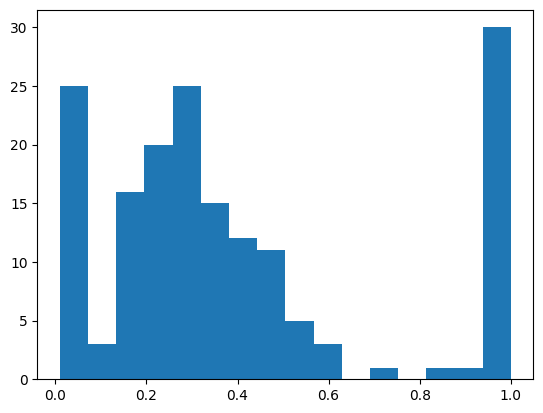

In [44]:
plt.hist(df['Hshell'],bins=16)

In [47]:
Sel_E = [
    4,8,9,11,13,14,24,28,31,35,38,52,71,80,82,100,101,112,114,117,118,119,127,135,138,143,144,152,153,156,167
]

(array([1., 0., 0., 1., 1., 3., 2., 3., 7., 5., 1., 4., 0., 0., 2., 1.]),
 array([0.01      , 0.0371418 , 0.06428359, 0.09142539, 0.11856719,
        0.14570898, 0.17285078, 0.19999258, 0.22713437, 0.25427617,
        0.28141797, 0.30855976, 0.33570156, 0.36284336, 0.38998515,
        0.41712695, 0.44426875]),
 <BarContainer object of 16 artists>)

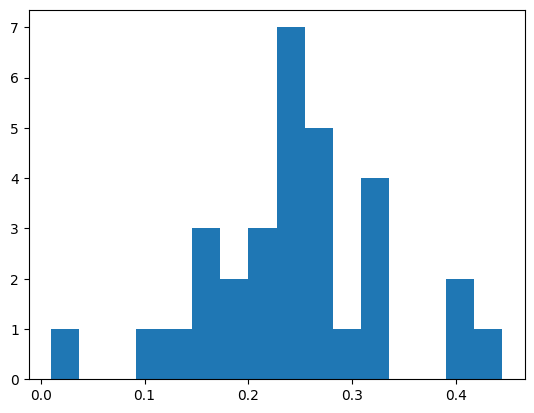

In [49]:
plt.hist(df['Hshell'][Sel_E],bins=16)

(array([1., 0., 0., 3., 1., 8., 3., 1., 6., 3., 1., 1., 2., 0., 0., 1.]),
 array([0.15973099, 0.21526143, 0.27079187, 0.32632231, 0.38185276,
        0.4373832 , 0.49291364, 0.54844408, 0.60397452, 0.65950496,
        0.71503541, 0.77056585, 0.82609629, 0.88162673, 0.93715717,
        0.99268761, 1.04821806]),
 <BarContainer object of 16 artists>)

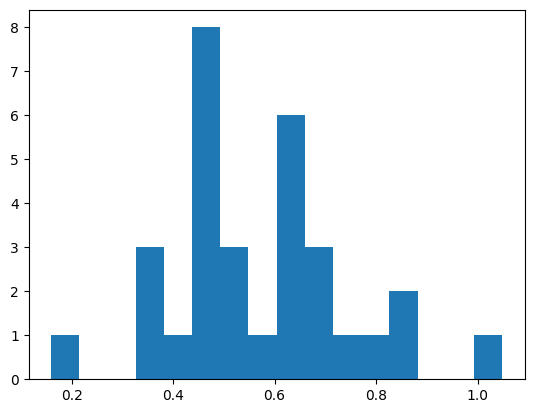

In [50]:
plt.hist(df['Rshell'][Sel_E],bins=16)

(array([1., 1., 6., 0., 2., 4., 5., 4., 1., 1., 3., 1., 1., 0., 0., 1.]),
 array([0.05344374, 0.06439518, 0.07534661, 0.08629805, 0.09724948,
        0.10820092, 0.11915235, 0.13010379, 0.14105522, 0.15200666,
        0.16295809, 0.17390953, 0.18486096, 0.1958124 , 0.20676383,
        0.21771527, 0.2286667 ]),
 <BarContainer object of 16 artists>)

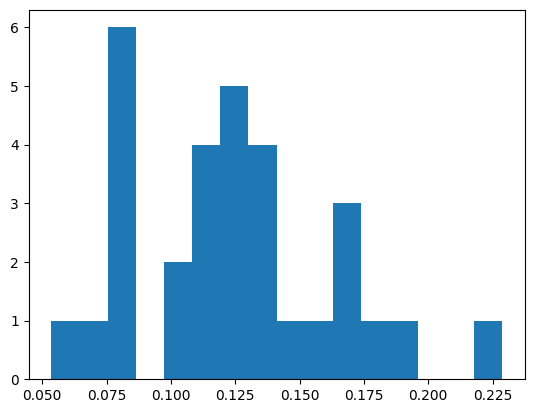

In [51]:
plt.hist(df['Rcore'][Sel_E],bins=16)

In [52]:
Sel_HP = []

In [53]:
mal_HP = [
    1,2,3,7,8,15,16,28,35,36,38,47,48,49,51,53,54,58,64,65,66,85,88,94,96,97,115,120,151,159
]

In [54]:
for i in Sel_E:
    if i in mal_HP:
        print(i)

8
28
35
38


In [55]:
results_table

PA,Sep,Bcore,Bshell,Bbg,Rcore,Rshell,Hshell
deg,arcsec,,,,arcsec,arcsec,arcsec
float64,float64,float64,float64,float64,float64,float64,float64
296.28,2.98,5.47,0.80,10.57,0.14,0.10,1.00
66.87,3.15,2.48,2.50,5.95,0.09,0.56,0.32
30.92,3.31,7.29,0.80,9.36,0.11,0.10,1.00
71.97,3.52,0.01,0.01,8.98,0.01,0.10,0.01
16.83,3.80,4.93,2.43,5.96,0.11,0.75,0.25
57.69,4.38,1.64,0.01,3.81,0.09,0.79,0.01
...,...,...,...,...,...,...,...
88.55,30.80,0.49,0.01,1.73,0.10,0.10,0.01


In [56]:
results_table.write('JWST-combo-E.ecsv',overwrite=True)

In [57]:
'''                   Para arreglos            '''

'                   Para arreglos            '

In [77]:
hche = [
    8,11,24,31,38,71,80,117,118,138,152,166
]

Text(0.5, 1.0, 'globulos en los que solo se detecto cascara en HST')

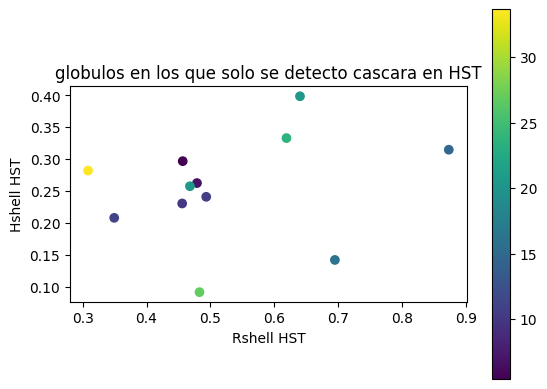

In [78]:
g = plt.scatter(df['Rshell'][hche],df['Hshell'][hche],c=df['Sep'][hche])
plt.colorbar(g)
plt.xlabel('Rshell HST')
plt.ylabel('Hshell HST')
plt.gca().set_aspect('equal')
plt.title('globulos en los que solo se detecto cascara en HST')

In [72]:
for i in hche:
    print(i  ,  df['Rshell'][i]  , df['Hshell'][i])

4 0.7463792768559276 0.24764527565370142
8 0.45669295207068605 0.29708646533946076
11 0.47899787217355266 0.2627826086615798
24 0.4558080394232012 0.2307696817911854
31 0.4934925824929984 0.2412157207857181
38 0.3493236335312419 0.2082806334333235
71 0.8735997201163326 0.3150161526071453
80 0.6951348069753143 0.14230260370451564
101 0.48512644272416944 0.40805275021828225
114 1.048218055982156 0.27767062870097414
117 0.6404249316522488 0.39879509717197376
118 0.46797580393066285 0.25781516495733264
138 0.6192667139680439 0.3332783139216712
152 0.4829514162813768 0.09184153486339532
166 0.3083620812569696 0.28236409204008167


In [91]:
Sel_jw = [
    8,9,11,13,14,24,28,31,35,38,43,52,71,80,82,100,117,118,125,127,135,138,143,144,152,153,156,166
]

Text(0.5, 1.0, 'globulos en los que solo se detecto cascara en HST')

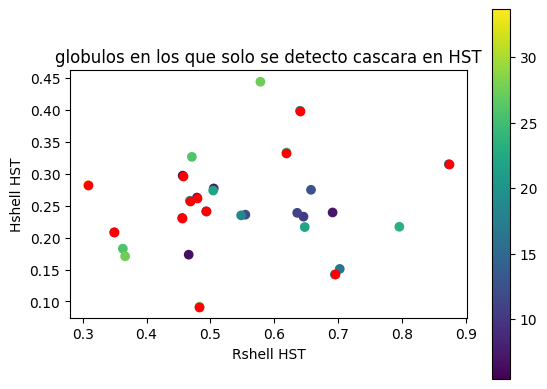

In [92]:
g = plt.scatter(df['Rshell'][Sel_jw],df['Hshell'][Sel_jw],c=df['Sep'][Sel_jw])
plt.colorbar(g)
plt.scatter(df['Rshell'][hche],df['Hshell'][hche],color='r')
plt.xlabel('Rshell HST')
plt.ylabel('Hshell HST')
plt.gca().set_aspect('equal')
plt.title('globulos en los que solo se detecto cascara en HST')

In [93]:
len(hche)

12

In [94]:
len(Sel_jw)

28